In [1]:
using Distributions
using StatsPlots
using StatsBase
using LaTeXStrings
using CSV
using DataFrames
using StatisticalRethinking
using StatisticalRethinking: link
using LinearAlgebra
using Logging
using Random
using Turing

# setting default attributes for plots
default(label=false)
Logging.disable_logging(Logging.Warn);

# 4.1 Why normal distributions are normal

Pairplots.jl
- https://sefffal.github.io/PairPlots.jl/dev/guide/https://sefffal.github.io/PairPlots.jl/dev/guide/
- https://juliahub.com/ui/Packages/General/PairPlots

## Code 4.1

size(n) = (1000, 16)


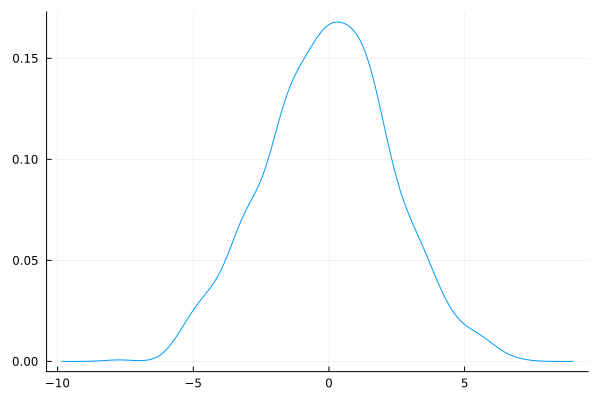

In [152]:
# equivalent to R runif(): random sample 16 times from a uniform distribution (-1,1)
n = rand(Uniform(-1, 1), 1000, 16);
@show size(n)
pos = sum.(eachrow(n));
density(pos)

## Code 4.2

In [3]:
prod(1 .+ rand(Uniform(0, .1), 12))

1.7469924003156037

## Code 4.3

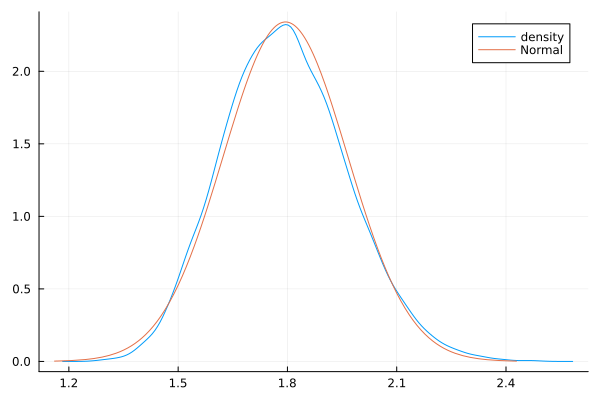

In [4]:
u = Uniform(0, .1)
growth = prod.(eachrow(1 .+ rand(u, 10000, 12)));

density(growth; label="density")
# overlay normal distribution
μ = mean(growth)
σ = std(growth)
plot!(Normal(μ, σ); label="Normal")

## Code 4.4

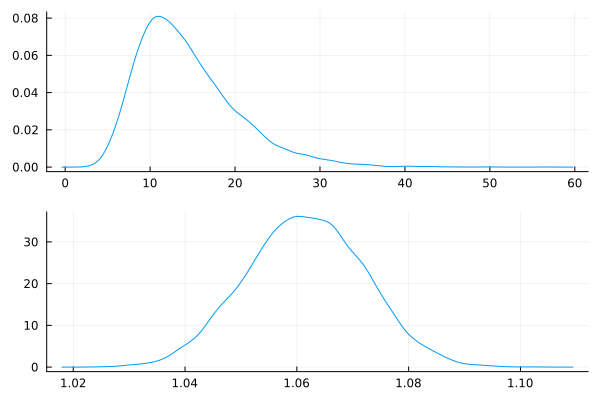

In [5]:
big = prod.(eachrow(1 .+ rand(Uniform(0, 0.5), 10000, 12)));
small = prod.(eachrow(1 .+ rand(Uniform(0, 0.01), 10000, 12)));
density([big, small]; layout=(2, 1))

## Code 4.5

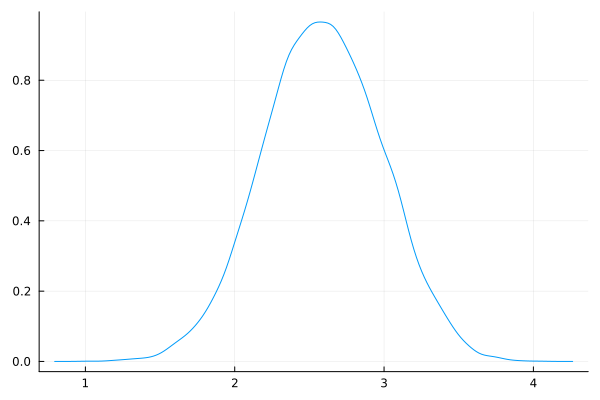

In [6]:
density(log.(big))

# 4.2 A language for describing models

## Code 4.6 Grid-search to calculate posterior

In [7]:
w = 6
n = 9
p_grid = range(0, 1; length=100)
bin_dens = [pdf(Binomial(n, p), w) for p in p_grid]
uni_dens = [pdf(Uniform(0, 1), p) for p in p_grid];
posterior = bin_dens .* uni_dens
posterior /= sum(posterior);

In [8]:
posterior

100-element Vector{Float64}:
 0.0
 8.741893987914909e-12
 5.425284098722297e-10
 5.990575360568051e-9
 3.261805587160897e-8
 1.2053991899464767e-7
 3.485649034505518e-7
 8.509009932076811e-7
 1.834811305202922e-6
 3.598403772645905e-6
 6.547828990010935e-6
 1.1213248218015673e-5
 1.826301780861177e-5
 ⋮
 0.0057411830876240195
 0.004616016455259013
 0.0035984037726459104
 0.0027005089649864604
 0.0019317387539326666
 0.0012980121298369258
 0.0008009482246260066
 0.00043696727582688777
 0.00019629917341509366
 6.189387892791484e-5
 8.227800686273486e-6
 0.0

# 4.3 Gaussian model of height

## Code 4.7 Load data/Howell1.csv

In [104]:
d = DataFrame(CSV.File("data/Howell1.csv"));

In [105]:
d

Row,height,weight,age,male
,Float64,Float64,Float64,Int64
1,151.765,47.8256,63.0,1
2,139.7,36.4858,63.0,0
3,136.525,31.8648,65.0,0
4,156.845,53.0419,41.0,1
5,145.415,41.2769,51.0,0
6,163.83,62.9926,35.0,1
7,149.225,38.2435,32.0,0
8,168.91,55.48,27.0,1
9,147.955,34.8699,19.0,0


In [11]:
size(d)

(544, 4)

## Code 4.8 Describe the dataset

In [12]:
describe(d)

Row,variable,mean,min,median,max,nmissing,eltype
,Symbol,Float64,Real,Float64,Real,Int64,DataType
1,height,138.264,53.975,148.59,179.07,0,Float64
2,weight,35.6106,4.25242,40.0578,62.9926,0,Float64
3,age,29.3444,0.0,27.0,88.0,0,Float64
4,male,0.472426,0,0.0,1,0,Int64


In [102]:
parentmodule(describe)

DataAPI

## Code 4.9 summarize the dataset and draw distributions

In [13]:
precis(d)

┌────────┬────────────────────────────────────────────────────────────┐
│  param │    mean      std     5.5%      50%    94.5%      histogram │
├────────┼────────────────────────────────────────────────────────────┤
│ height │ 138.264  27.6024  81.1086   148.59  165.735  ▁▁▁▂▂▂▂▂▂██▆▁ │
│ weight │ 35.6106  14.7192   9.3607  40.0578  54.5029  ▁▃▄▄▃▂▃▆██▅▃▁ │
│    age │ 29.3444  20.7469      1.0     27.0   66.135      █▆▆▆▆▃▃▁▁ │
│   male │  0.4724   0.4997      0.0      0.0      1.0    █▁▁▁▁▁▁▁▁▁█ │
└────────┴────────────────────────────────────────────────────────────┘


## Code 4.10 Distribution of height

In [106]:
d.height

544-element Vector{Float64}:
 151.765
 139.7
 136.525
 156.845
 145.415
 163.83
 149.225
 168.91
 147.955
 165.1
 154.305
 151.13
 144.78
   ⋮
 156.21
 152.4
 162.56
 114.935
  67.945
 142.875
  76.835
 145.415
 162.56
 156.21
  71.12
 158.75

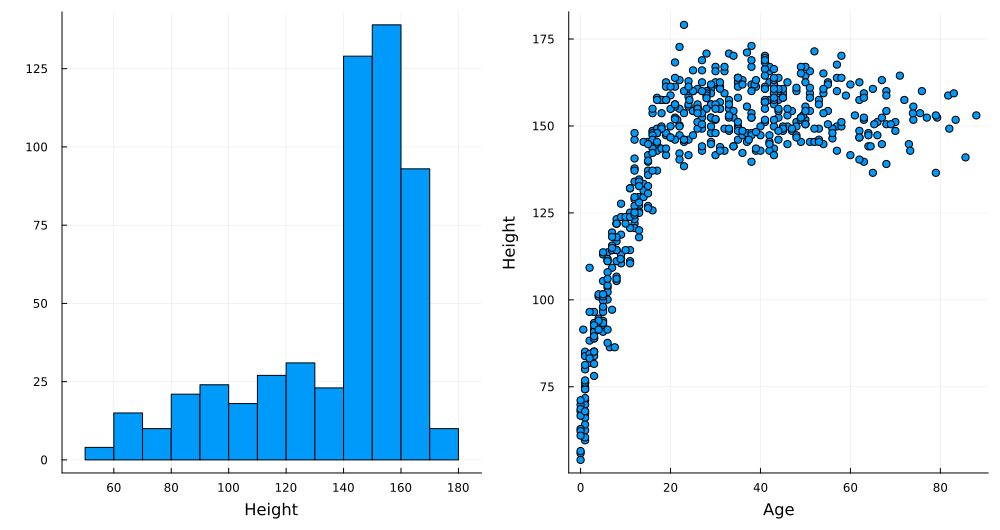

In [109]:
h_of_height = histogram(d.height, xaxis="Height")
s_age_vs_height = scatter(d.age, d.height, xaxis="Age", yaxis="Height", legend=false)

plot(h_of_height, s_age_vs_height, layout=(1,2), left_margin=5*Plots.mm, 
    bottom_margin=5*Plots.mm, size=(1000,530) ) 

┌ Warning: Module Plots with build ID fafbfcfd-fb9a-30d8-0003-6cdbefd1469b is missing from the cache.
│ This may mean Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80] does not support precompilation but is imported by a module that does.
└ @ Base loading.jl:1793
┌ Warning: Module Plots with build ID fafbfcfd-fb9a-30d8-0003-6cdbefd1469b is missing from the cache.
│ This may mean Plots [91a5bcdd-55d7-5caf-9e0b-520d859cae80] does not support precompilation but is imported by a module that does.
└ @ Base loading.jl:1793


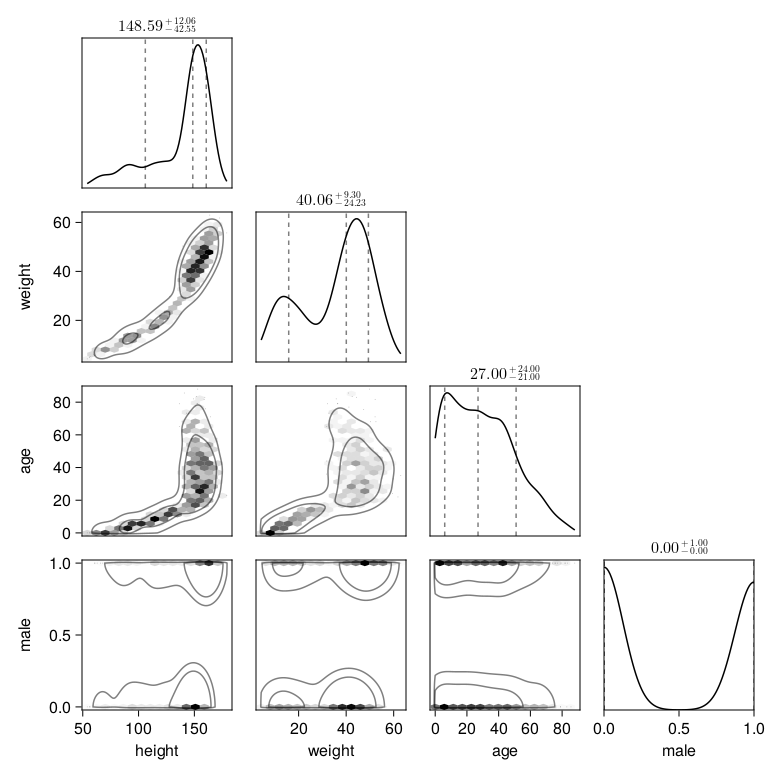

In [110]:
using CairoMakie
using PairPlots

pairplot(d)

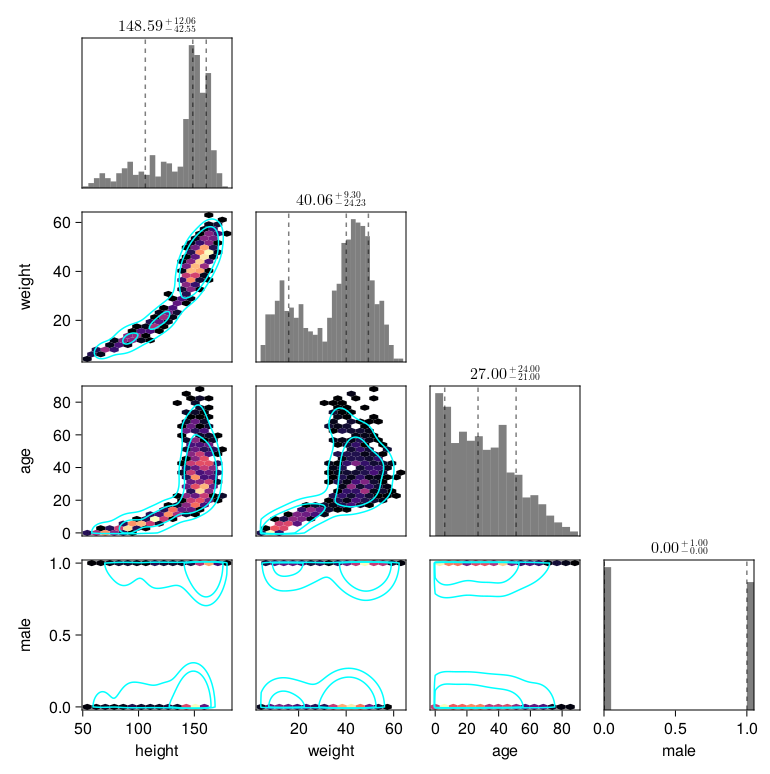

In [118]:
pairplot(
    d => (
        #PairPlots.HexBin(colormap=Makie.cgrad([:transparent, :black])),
        PairPlots.HexBin(colormap=:magma), 
        PairPlots.Scatter(filtersigma=2, color=:black),
        #PairPlots.Contour(color=:black),
        PairPlots.Contour(color=:cyan, strokewidth=5),

        # New:
        PairPlots.MarginHist(),
        PairPlots.MarginConfidenceLimits(),
    )
)

## Code 4.11  select individuals with age>=18

In [15]:
d2 = d[d.age .>= 18,:];

In [16]:
size(d2)

(352, 4)

## Code 4.12 Draw the prior for $\mu$

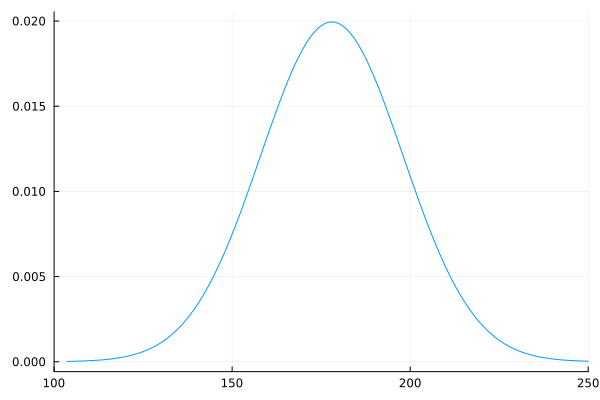

In [17]:
plot(Normal(178, 20); xlim=(100, 250))

## Code 4.13 Draw the prior of $\sigma$

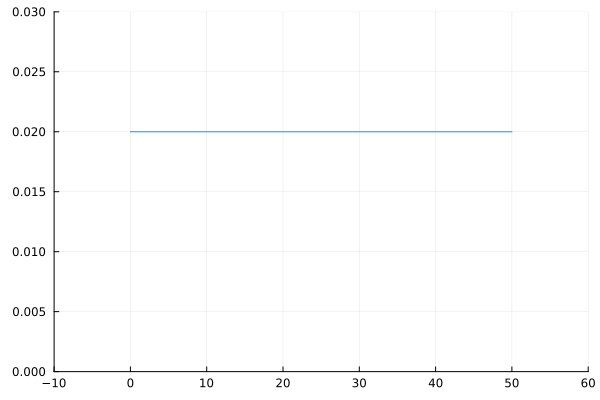

In [18]:
plot(Uniform(0, 50), xlim=(-10, 60), ylim=(0, 0.03))

## Code 4.14 Prior predictive simulation for the height model

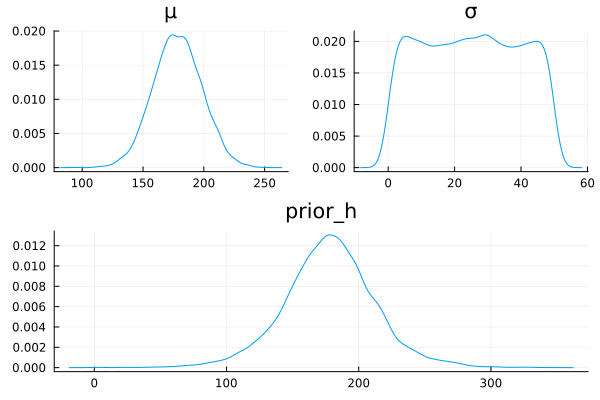

In [19]:
n = 10_000
sample_μ = rand(Normal(178, 20), n)
sample_σ = rand(Uniform(0, 50), n);
prior_h = [rand(Normal(μ, σ)) for (μ, σ) in zip(sample_μ, sample_σ)];

p1 = density(sample_μ; title="μ")
p2 = density(sample_σ; title="σ")
p3 = density(prior_h; title="prior_h")

plot(p1, p2, p3, layout=@layout [a b; c])

## Code 4.15. 0-272cm.

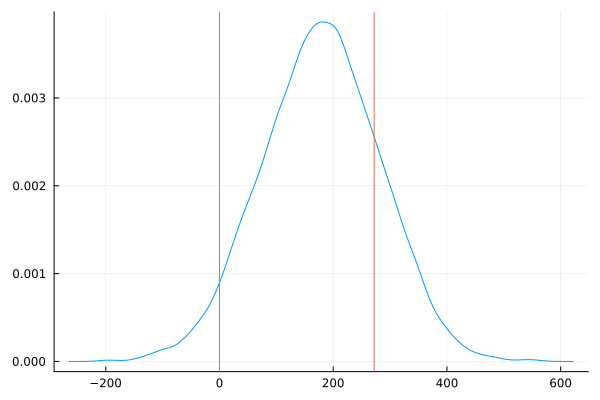

In [20]:
sample_μ = rand(Normal(178, 100), n)
prior_h = [rand(Normal(μ, σ)) for (μ, σ) in zip(sample_μ, sample_σ)];

density(prior_h)
vline!([0, 272])

## Code 4.16 Grid-search: Calculate posterior of $\mu$ and $\sigma$ using logpdf()

In [21]:
μ_list = range(150, 160; length=100)
σ_list = range(7, 9; length=100)

log_likelihood = [
    sum(logpdf.(Normal(μ, σ), d2.height))
    for μ ∈ μ_list, σ ∈ σ_list
]
log_prod = log_likelihood .+ [
    logpdf.(Normal(178, 20), μ) + logpdf(Uniform(0, 50), σ)
    for μ ∈ μ_list, σ ∈ σ_list
];

max_prod = maximum(log_prod)
prob = @. exp(log_prod - max_prod);

In [22]:
@show size(log_likelihood)
@show size(log_prod)
@show size(prob)


size(log_likelihood) = (100, 100)
size(log_prod) = (100, 100)
size(prob) = (100, 100)


(100, 100)

In [23]:
prob

100×100 Matrix{Float64}:
 1.96264e-35  3.78109e-35  7.20152e-35  …  5.41219e-24  5.41688e-24
 5.35416e-34  1.01212e-33  1.89181e-33     4.04659e-23  4.01385e-23
 1.35737e-32  2.51878e-32  4.62223e-32     2.89369e-22  2.84516e-22
 3.1979e-31   5.82757e-31  1.05038e-30     1.97906e-21  1.92923e-21
 7.00144e-30  1.2535e-29   2.22006e-29     1.29454e-20  1.25139e-20
 1.42452e-28  2.50669e-28  4.3642e-28   …  8.09868e-20  7.76492e-20
 2.69342e-27  4.66035e-27  7.9793e-27      4.84574e-19  4.60906e-19
 4.73258e-26  8.05519e-26  1.3569e-25      2.77302e-18  2.6171e-18
 7.72768e-25  1.29441e-24  2.1461e-24      1.51772e-17  1.42155e-17
 1.17262e-23  1.9338e-23   3.157e-23       7.94464e-17  7.38644e-17
 1.65357e-22  2.68589e-22  4.31938e-22  …  3.97745e-16  3.67148e-16
 2.16694e-21  3.46821e-21  5.49654e-21     1.9045e-15   1.74574e-15
 2.63892e-20  4.16355e-20  6.50547e-20     8.72172e-15  7.94058e-15
 ⋮                                      ⋱               
 5.66743e-31  1.03237e-30  1.86004e

In [24]:
size(μ_list)

(100,)

In [25]:
sizeof(prob)

80000

## Code 4.17  Contour of posterior prob of $\mu$ and $\sigma$

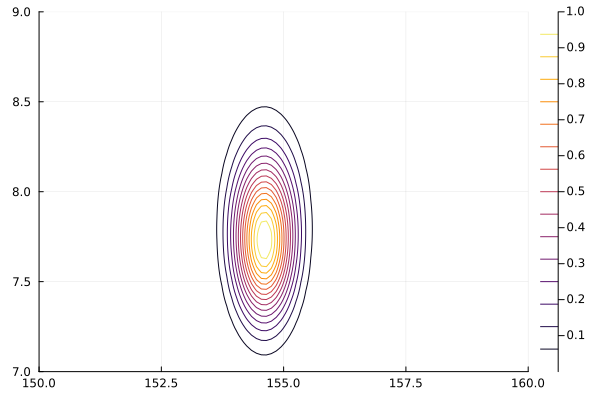

In [26]:
# note the transposition, that's due to Julia matrix order
contour(μ_list, σ_list, prob')

## Code 4.18

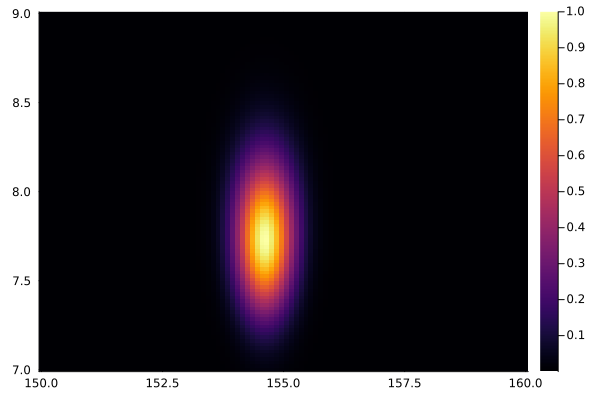

In [27]:
heatmap(μ_list, σ_list, prob')

## Code 4.19

In [28]:
indices = collect(Iterators.product(1:length(μ_list), 1:length(σ_list)));
sample_idx = wsample(vec(indices), vec(prob), 10_000; replace=true)
sample_μ = μ_list[first.(sample_idx)]
sample_σ = σ_list[last.(sample_idx)];

In [29]:
@show size(indices)
@show size(sample_idx)
@show size(sample_μ)

size(indices) = (100, 100)
size(sample_idx) = (10000,)
size(sample_μ) = (10000,)


(10000,)

In [30]:
indices

100×100 Matrix{Tuple{Int64, Int64}}:
 (1, 1)    (1, 2)    (1, 3)    (1, 4)    …  (1, 98)    (1, 99)    (1, 100)
 (2, 1)    (2, 2)    (2, 3)    (2, 4)       (2, 98)    (2, 99)    (2, 100)
 (3, 1)    (3, 2)    (3, 3)    (3, 4)       (3, 98)    (3, 99)    (3, 100)
 (4, 1)    (4, 2)    (4, 3)    (4, 4)       (4, 98)    (4, 99)    (4, 100)
 (5, 1)    (5, 2)    (5, 3)    (5, 4)       (5, 98)    (5, 99)    (5, 100)
 (6, 1)    (6, 2)    (6, 3)    (6, 4)    …  (6, 98)    (6, 99)    (6, 100)
 (7, 1)    (7, 2)    (7, 3)    (7, 4)       (7, 98)    (7, 99)    (7, 100)
 (8, 1)    (8, 2)    (8, 3)    (8, 4)       (8, 98)    (8, 99)    (8, 100)
 (9, 1)    (9, 2)    (9, 3)    (9, 4)       (9, 98)    (9, 99)    (9, 100)
 (10, 1)   (10, 2)   (10, 3)   (10, 4)      (10, 98)   (10, 99)   (10, 100)
 (11, 1)   (11, 2)   (11, 3)   (11, 4)   …  (11, 98)   (11, 99)   (11, 100)
 (12, 1)   (12, 2)   (12, 3)   (12, 4)      (12, 98)   (12, 99)   (12, 100)
 (13, 1)   (13, 2)   (13, 3)   (13, 4)      (13, 98)   (13, 

In [31]:
?wsample

search: wsample wsample!



```
wsample([rng], [a], w)
```

Select a weighted random sample of size 1 from `a` with probabilities proportional to the weights given in `w`. If `a` is not present, select a random weight from `w`.

Optionally specify a random number generator `rng` as the first argument (defaults to `Random.GLOBAL_RNG`).

---

```
wsample([rng], [a], w, n::Integer; replace=true, ordered=false)
```

Select a weighted random sample of size `n` from `a` with probabilities proportional to the weights given in `w` if `a` is present, otherwise select a random sample of size `n` of the weights given in `w`. `replace` dictates whether sampling is performed with replacement. `ordered` dictates whether an ordered sample (also called a sequential sample, i.e. a sample where items appear in the same order as in `a`) should be taken.

Optionally specify a random number generator `rng` as the first argument (defaults to `Random.GLOBAL_RNG`).

---

```
wsample([rng], [a], w, dims::Dims; replace=true, ordered=false)
```

Select a weighted random sample from `a` with probabilities proportional to the weights given in `w` if `a` is present, otherwise select a random sample of size `n` of the weights given in `w`. The dimensions of the output are given by `dims`.

Optionally specify a random number generator `rng` as the first argument (defaults to `Random.GLOBAL_RNG`).


## Code 4.20 Scatter plot of the posterior distribution of $\mu$ , $\sigma$

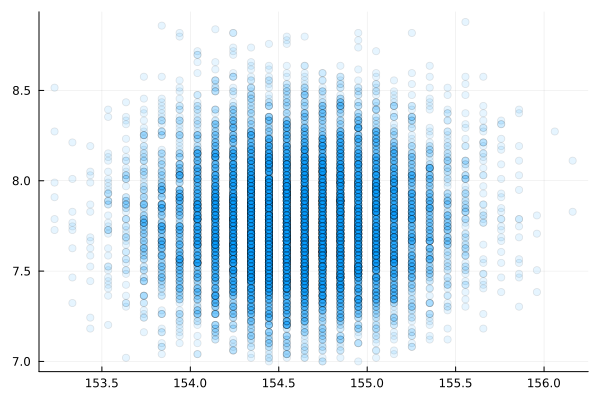

In [32]:
scatter(sample_μ, sample_σ; alpha=0.1)

## Code 4.21

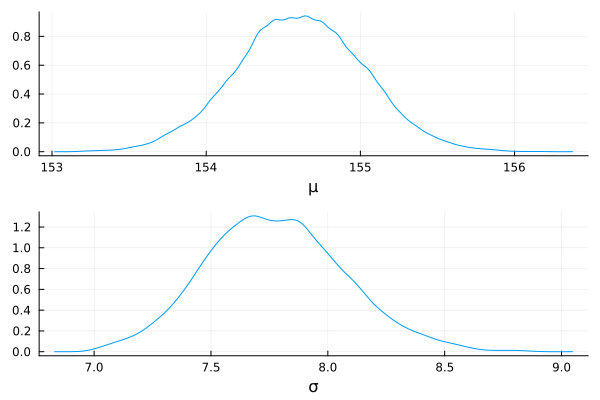

In [33]:
p1 = density(sample_μ, xaxis="μ")
p2 = density(sample_σ, xaxis="σ")
plot(p1, p2, layout=(2,1))

Pr(p|w) = (Pr(w|p)* Pr(p) )/P(w)

P(w) = \integral Pr(w, p) dp

## Code 4.22

In [34]:
println(hpdi(sample_μ, alpha=0.11))
println(hpdi(sample_σ, alpha=0.11))

[153.83838383838383, 155.15151515151516]
[7.303030303030303, 8.232323232323232]


## Code 4.23 Generate a smaller dataset with 20 individuals sampled from the whole dataset

In [35]:
d3 = sample(d2.height, 20);

## Code 4.24 Posterior based on the smaller dataset

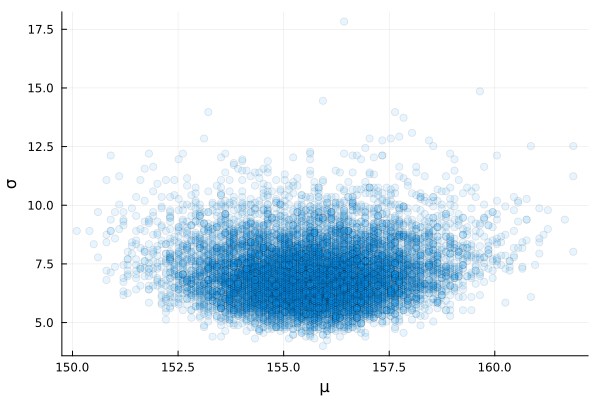

In [36]:
μ_list = range(150, 170; length=200)
σ_list = range(4, 20; length=200)

log_likelihood = [
    sum(logpdf.(Normal(μ, σ), d3))
    for μ ∈ μ_list, σ ∈ σ_list
]
log_prod = log_likelihood .+ [
    logpdf.(Normal(178, 20), μ) + logpdf(Uniform(0, 50), σ)
    for μ ∈ μ_list, σ ∈ σ_list
]

max_prod = maximum(log_prod)
prob2 = @. exp(log_prod - max_prod)

indices = collect(Iterators.product(1:length(μ_list), 1:length(σ_list)));
sample2_idx = wsample(vec(indices), vec(prob2), 10_000; replace=true)
sample2_μ = μ_list[first.(sample2_idx)]
sample2_σ = σ_list[last.(sample2_idx)]

scatter(sample2_μ, sample2_σ; xaxis="μ", yaxis="σ", alpha=0.1)

## Code 4.25

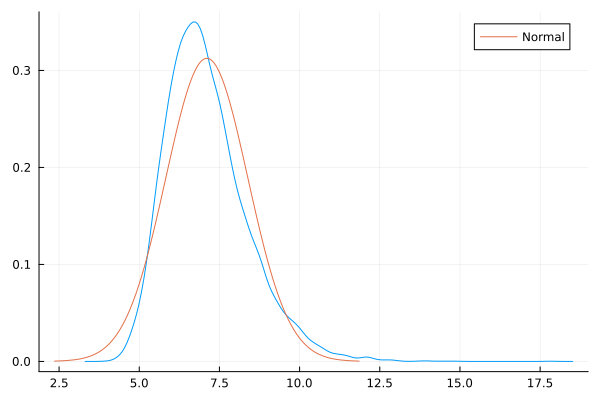

In [37]:
density(sample2_σ)
μ = mean(sample2_σ)
σ = std(sample2_σ)
plot!(Normal(μ, σ); label="Normal")

## Code 4.26 Read data/Howell1.csv

In [38]:
d = DataFrame(CSV.File("data/Howell1.csv"));
d2 = d[d.age .>= 18,:];

## Code 4.27 The Height Bayesian Model

In [39]:
@model function model_height(height)
    μ ~ Normal(178, 20)
    σ ~ Uniform(0, 50)
    height ~ Normal(μ, σ)
end

model_height (generic function with 2 methods)

## Code 4.28 MCMC for the Height model

In [40]:
@time m4_1 = sample(model_height(d2.height), NUTS(), 1000)

 18.457414 seconds (32.88 M allocations: 2.054 GiB, 7.70% gc time, 98.06% compilation time)


Chains MCMC chain (1000×14×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 7.16 seconds
Compute duration  = 7.16 seconds
parameters        = μ, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

           μ   154.6147    0.4214    0.0137    939.6934   653.6702    1.0008   ⋯
           σ     7.7763    0.2991    0.0090   1105.4345   646.8239    1.0003   ⋯
                                                                1 column omitted

Quantiles
  parameters       2.5%      25.0%      50.0%      75.0%      97.5% 
      Symbol    Float64    Float64    Float64    Float64    Float64 

 

## Code 4.29 89% credible interval of estimates

In [41]:
display.(describe(m4_1; q=[0.055, 0.945]));

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

           μ   154.6147    0.4214    0.0137    939.6934   653.6702    1.0008   ⋯
           σ     7.7763    0.2991    0.0090   1105.4345   646.8239    1.0003   ⋯
                                                                1 column omitted


Quantiles
  parameters       5.5%      94.5% 
      Symbol    Float64    Float64 

           μ   153.9708   155.3093
           σ     7.3062     8.2557


## Code 4.30 use the mean and std from the dataset as the initial values for the MCMC

In [42]:
init_vals = [mean(d2.height), std(d2.height)]
@time chain = sample(model_height(d2.height), NUTS(), 1000, init_theta=init_vals)

  1.719664 seconds (1.82 M allocations: 129.850 MiB, 4.59% gc time, 95.15% compilation time)


Chains MCMC chain (1000×14×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 0.66 seconds
Compute duration  = 0.66 seconds
parameters        = μ, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

           μ   154.5902    0.4192    0.0129   1057.1814   753.3662    1.0088   ⋯
           σ     7.7734    0.2969    0.0095    985.6409   764.7553    0.9992   ⋯
                                                                1 column omitted

Quantiles
  parameters       2.5%      25.0%      50.0%      75.0%      97.5% 
      Symbol    Float64    Float64    Float64    Float64    Float64 

 

## Code 4.31 MCMC with a $\mu$ prior that has small stddev

In [43]:
@model function model_height(height)
    μ ~ Normal(178, 0.1)
    σ ~ Uniform(0, 50)
    height ~ Normal(μ, σ)
end

m4_2 = sample(model_height(d2.height), NUTS(), 1000)
display.(describe(m4_2; q=[0.055, 0.945]));

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

           μ   177.8606    0.1018    0.0030   1114.4749   694.3192    0.9997   ⋯
           σ    24.5986    0.8971    0.0271   1100.3583   720.8847    1.0002   ⋯
                                                                1 column omitted


Quantiles
  parameters       5.5%      94.5% 
      Symbol    Float64    Float64 

           μ   177.7025   178.0200
           σ    23.2222    26.1043


## Code 4.32 covariance of $\hat\mu$, $\hat\sigma$

In [44]:
cov(hcat(m4_1[:μ], m4_1[:σ]))

2×2 Matrix{Float64}:
  0.177602    -0.00379049
 -0.00379049   0.089453

## Code 4.33  covariance and correlation of $\hat\mu$, $\hat\sigma$

In [45]:
@show c = cov(hcat(m4_1[:μ], m4_1[:σ]))
@show diag(c)
@show cov2cor(c, diag(c))

c = cov(hcat(m4_1[:μ], m4_1[:σ])) = [0.1776018881338889 -0.0037904864757000415; -0.0037904864757000415 0.0894529722595445]
diag(c) = [0.1776018881338889, 0.0894529722595445]
cov2cor(c, diag(c)) = [1.0 -0.23859019789449779; -0.23859019789449779 1.0]


2×2 Matrix{Float64}:
  1.0      -0.23859
 -0.23859   1.0

## Code 4.34

In [46]:
samp_chain2 = sample(m4_1, 10_000)
samp_df2 = DataFrame(samp_chain2)
@show size(samp_df2)
# check the top 5 values from this data frame
first(samp_df2, 5)

size(samp_df2) = (10000, 2)


Row,μ,σ
,Float64,Float64
1,154.331,7.39876
2,154.888,7.51465
3,154.533,7.733
4,154.994,7.83346
5,154.311,7.94622


- 20230513 sampling from the chain directly is fixed. resetrange() is no longer needed.

- resetrange() is needed due to bug in MCMCChains: https://github.com/TuringLang/MCMCChains.jl/issues/324
- Once it will be fixed, direct sampling from the chain will be possible

In [47]:
samp_chain = sample(resetrange(m4_1), 10_000)
samp_df = DataFrame(samp_chain)
first(samp_df, 5)

Row,μ,σ
,Float64,Float64
1,154.88,7.7677
2,154.292,8.3048
3,154.782,7.44353
4,154.333,7.4644
5,153.783,7.7903


In [48]:
?resetrange

search: resetrange



```
resetrange(chains::Chains)
```

Generate a new chain from `chains` with iterations indexed by `1:n`, where `n` is the number of samples per chain.

The new chain and `chains` share the same data in memory.


In [49]:
parentmodule(resetrange)

MCMCChains

In [50]:
precis(samp_df2)

┌───────┬─────────────────────────────────────────────────────────┐
│ param │    mean     std     5.5%      50%    94.5%    histogram │
├───────┼─────────────────────────────────────────────────────────┤
│     μ │ 154.621  0.4177  153.972  154.636  155.312       ▁▂▇█▄▁ │
│     σ │  7.7756  0.2975   7.3134   7.7591    8.277  ▁▁▃▆█▇▄▃▁▁▁ │
└───────┴─────────────────────────────────────────────────────────┘


## Code 4.35 summarizing the estimates

In [51]:
precis(samp_df)

┌───────┬───────────────────────────────────────────────────────┐
│ param │    mean     std    5.5%     50%    94.5%    histogram │
├───────┼───────────────────────────────────────────────────────┤
│     μ │ 154.616  0.4255  153.96  154.63  155.309       ▁▂▇█▄▁ │
│     σ │  7.7711  0.2988   7.301  7.7591   8.2545  ▁▁▃▆██▄▂▁▁▁ │
└───────┴───────────────────────────────────────────────────────┘


In [52]:
parentmodule(precis)

StatisticalRethinking

## Code 4.36 sample from multi-variate normal

In [53]:
data = hcat(m4_1[:μ], m4_1[:σ])
@show size(data)
@show μ = mean(data, dims=1)
@show σ = cov(data)
@show mvn = MvNormal(vec(μ), σ)
post = rand(mvn, 10_000);
print(mvn)

size(data) = (1000, 2)
μ = mean(data, dims = 1) = [154.61472570193342 7.776293269123465]
σ = cov(data) = [0.1776018881338889 -0.0037904864757000415; -0.0037904864757000415 0.0894529722595445]
mvn = MvNormal(vec(μ), σ) = FullNormal(
dim: 2
μ: [154.61472570193342, 7.776293269123465]
Σ: [0.1776018881338889 -0.0037904864757000415; -0.0037904864757000415 0.0894529722595445]
)

FullNormal(
dim: 2
μ: [154.61472570193342, 7.776293269123465]
Σ: [0.1776018881338889 -0.0037904864757000415; -0.0037904864757000415 0.0894529722595445]
)


# 4.4 Linear predictions

## Code 4.37 fancy way of doing scatter(d2.weight, d2.height)

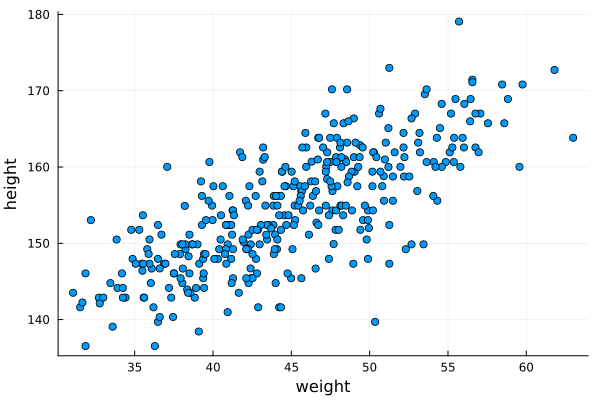

In [119]:
d = DataFrame(CSV.File("data/Howell1.csv"));
d2 = d[d.age .>= 18,:];
# fancy way of doing scatter(d2.weight, d2.height)
@df d2 scatter(:weight, :height, xaxis="weight", yaxis="height")

## Code 4.38 Prior predictive simulation

In [145]:
Random.seed!(2971)
N = 100
α_vec = rand(Normal(178, 20), N)
β_vec = rand(Normal(0, 10), N);

## Code 4.39 Draw different prior predictive simulations

In [121]:
extrema(d2.weight)

(31.071052, 62.992589)

In [123]:
parentmodule(extrema)

Base

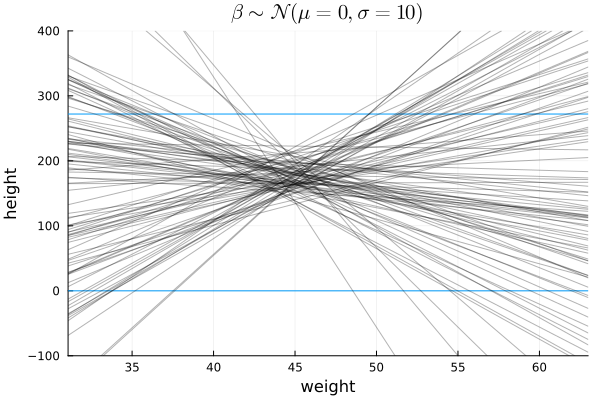

In [146]:
p = hline([0, 272]; ylims=(-100, 400), xlabel="weight", ylabel="height")
title!(L"\beta \sim \mathcal{N}(\mu=0,\sigma=10)")

x_mean = mean(d2.weight)
xlims = extrema(d2.weight)  # getting min and max in one pass

for (α, β) ∈ zip(α_vec, β_vec)
    plot!(x -> α + β * (x - x_mean); xlims=xlims, c=:black, alpha=0.3)
end
display(p)

## Code 4.40 log-normal for $\beta$.

- log($\beta$) ~ Normal(0,1).
- $\beta$ ~ $exp^{Normal(0,1)}$

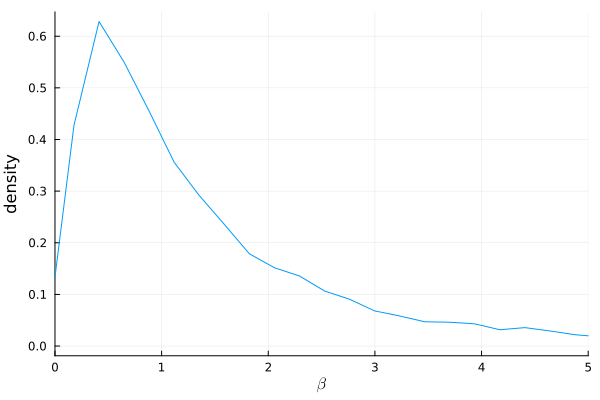

In [127]:
β_vec = rand(LogNormal(0, 1), 10_000)
density(β_vec, xlims=(0, 5), bandwidth=0.02, xaxis=L"\beta", yaxis="density")

## Code 4.41 Prior of $\beta$ in LogNormal

In [128]:
Random.seed!(2971)
N = 100
α_vec = rand(Normal(178, 20), N)
β_vec = rand(LogNormal(0, 1), N);

## Code 4.42 MCMC Sampling (Model fitting)

In [129]:
d = DataFrame(CSV.File("data/Howell1.csv"));
d2 = d[d.age .>= 18,:]
xbar = mean(d2.weight)

@model function height_regr_model(weight, height)
    α ~ Normal(178, 20)
    β ~ LogNormal(0, 1)
    μ = @. α + β * (weight - xbar)
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

@time m4_3 = sample(height_regr_model(d2.weight, d2.height), NUTS(), 1000)
@time m4_3 = resetrange(m4_3);
m4_3

  6.355703 seconds (6.31 M allocations: 588.068 MiB, 7.55% gc time, 94.81% compilation time: 20% of which was recompilation)
  0.000007 seconds (1 allocation: 96 bytes)


Chains MCMC chain (1000×15×1 Array{Float64, 3}):

Iterations        = 1:1000
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 5.3 seconds
Compute duration  = 5.3 seconds
parameters        = α, β, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

           α   154.5925    0.2685    0.0084   1042.7116   650.8592    1.0029   ⋯
           β     0.9027    0.0442    0.0011   1581.2344   769.2823    1.0000   ⋯
           σ     5.1032    0.1883    0.0049   1473.7644   767.7530    1.0005   ⋯
                                                                1 column omitted

Quantiles
  parameters       2.5%      25.0%      50.0%      75.0%      

## Code 4.43 Put exponential into $\beta$

In [147]:
xbar = mean(d2.weight)

@model function height_regr_model_exp(weight, height)
    α ~ Normal(178, 20)
    log_β ~ Normal(0, 1)
    μ = @. α + exp(log_β) * (weight - xbar)
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

@time m4_3b = sample(height_regr_model_exp(d2.weight, d2.height), NUTS(), 1000);
m4_3b

  2.516436 seconds (1.68 M allocations: 290.763 MiB, 5.28% gc time, 91.04% compilation time: 85% of which was recompilation)


Chains MCMC chain (1000×15×1 Array{Float64, 3}):

Iterations        = 501:1:1500
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 1.67 seconds
Compute duration  = 1.67 seconds
parameters        = α, log_β, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse    ess_bulk   ess_tail      rhat   ⋯
      Symbol    Float64   Float64   Float64     Float64    Float64   Float64   ⋯

           α   154.6040    0.2892    0.0074   1503.0693   726.6824    1.0048   ⋯
       log_β    -0.1002    0.0462    0.0011   1672.8657   785.9297    1.0027   ⋯
           σ     5.1077    0.1941    0.0055   1255.2909   761.0458    1.0079   ⋯
                                                                1 column omitted

Quantiles
  parameters       2.5%      25.0%      50.0%      7

In [148]:
exp(-0.0994)

0.9053804833900955

## Code 4.44 summarize the model estimates, mean, std, 89% CI, histogram

In [133]:
m4_3_df = DataFrame(m4_3)
precis(m4_3_df)

┌───────┬──────────────────────────────────────────────────────────┐
│ param │    mean     std     5.5%      50%    94.5%     histogram │
├───────┼──────────────────────────────────────────────────────────┤
│     α │ 154.593  0.2685  154.169  154.603  155.005    ▁▁▂▅██▅▂▁▁ │
│     β │  0.9027  0.0442    0.833   0.9013   0.9732       ▁▂██▃▁▁ │
│     σ │  5.1032  0.1883   4.8118   5.0941   5.4244  ▁▂▄▇██▆▄▂▁▁▁ │
└───────┴──────────────────────────────────────────────────────────┘


## Code 4.45 Covariance among parameters

In [62]:
round.(cov(Matrix(m4_3_df)), digits=3)

3×3 Matrix{Float64}:
  0.072  -0.0    -0.002
 -0.0     0.002   0.0
 -0.002   0.0     0.035

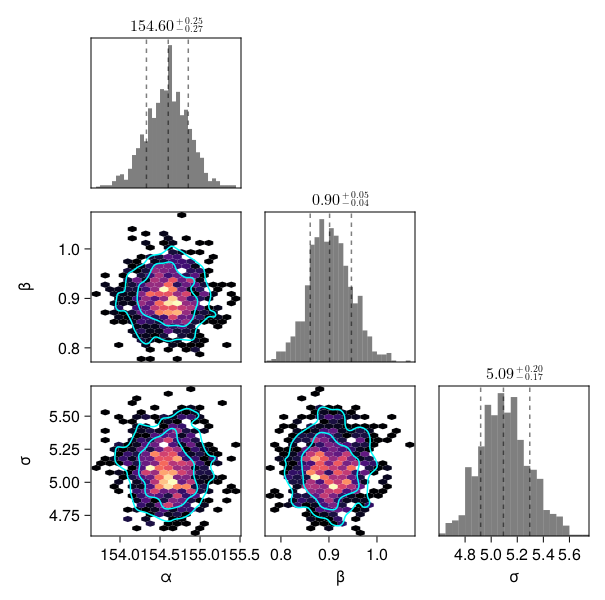

In [135]:
pairplot(
    m4_3_df => (
        #PairPlots.HexBin(colormap=Makie.cgrad([:transparent, :black])),
        PairPlots.HexBin(colormap=:magma), 
        PairPlots.Scatter(filtersigma=2, color=:black),
        #PairPlots.Contour(color=:black),
        PairPlots.Contour(color=:cyan, strokewidth=5),

        # New:
        PairPlots.MarginHist(),
        PairPlots.MarginConfidenceLimits(),
    )
)

## Code 4.46 Posterior inteference of height

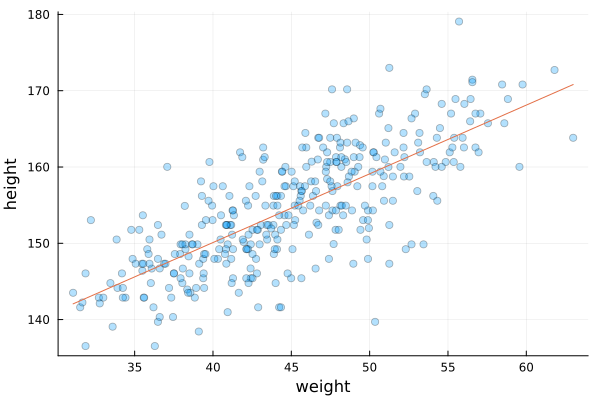

In [137]:
p = @df d2 scatter(:weight, :height; alpha=0.3, xaxis="weight", yaxis="height")

chain = resetrange(m4_3)
samples = sample(chain, 1000)

α_map = mean(samples[:α])
β_map = mean(samples[:β])
plot!(x -> α_map + β_map*(x-xbar))

## Code 4.47 DataFrame of posterior values of parameters

In [64]:
post = sample(m4_3, 1000)
post_df = DataFrame(post)
post_df[1:5,:]

Row,a,b,σ
,Float64,Float64,Float64
1,154.32,0.916849,5.08646
2,154.414,0.884345,4.80344
3,154.888,0.843046,5.12873
4,154.396,0.941856,5.28053
5,154.67,0.901098,5.34386


## Code 4.48 MCMC-Sample again with much less samples

In [142]:
N = 10
dN = d2[1:N,:]

@model function height_regr_model_N(weight, height)
    α ~ Normal(178, 20)
    β ~ LogNormal(0, 1)
    m_weight = mean(weight)
    μ = @. α + β * (weight - m_weight)
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

@time mN = sample(height_regr_model(dN.weight, dN.height), NUTS(), 1000)
mN = resetrange(mN);
mN

  0.213816 seconds (733.33 k allocations: 80.012 MiB, 33.73% gc time)


Chains MCMC chain (1000×15×1 Array{Float64, 3}):

Iterations        = 1:1000
Number of chains  = 1
Samples per chain = 1000
Wall duration     = 0.21 seconds
Compute duration  = 0.21 seconds
parameters        = α, β, σ
internals         = lp, n_steps, is_accept, acceptance_rate, log_density, hamiltonian_energy, hamiltonian_energy_error, max_hamiltonian_energy_error, tree_depth, numerical_error, step_size, nom_step_size

Summary Statistics
  parameters       mean       std      mcse   ess_bulk   ess_tail      rhat    ⋯
      Symbol    Float64   Float64   Float64    Float64    Float64   Float64    ⋯

           α   152.3526    1.9213    0.0909   623.5034   370.4717    0.9993    ⋯
           β     0.9082    0.1762    0.0075   588.7463   391.5824    1.0032    ⋯
           σ     5.8036    2.0881    0.1110   483.8357   503.7239    0.9995    ⋯
                                                                1 column omitted

Quantiles
  parameters       2.5%      25.0%      50.0%      75.0%    

## Code 4.49 Visualize the Model uncertainty

In [151]:
post = sample(mN, 20)
size(post)
post
post_df = DataFrame(post);
post_df

Row,α,β,σ
,Float64,Float64,Float64
1,152.832,0.899214,3.08286
2,147.75,0.914347,5.65082
3,150.603,1.27996,6.70213
4,150.266,0.731753,11.5171
5,151.985,0.891833,3.60649
6,150.448,0.892233,3.10016
7,152.058,0.844873,4.79021
8,153.126,0.931639,2.56948
9,152.136,0.641653,5.22805


post = MCMC chain (20×15×1 Array{Float64, 3})


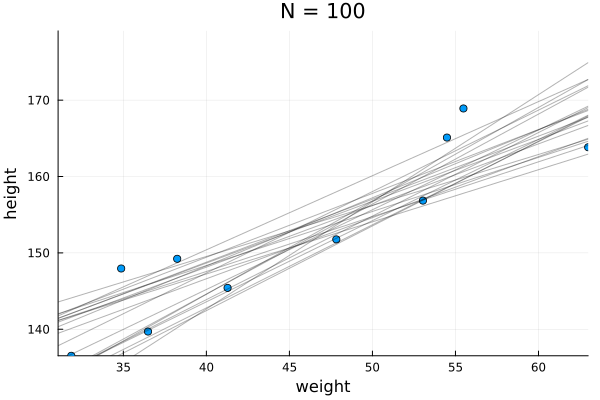

In [149]:
post = sample(mN, 20)
post_df = DataFrame(post);

xlims = extrema(d2.weight)
ylims = extrema(d2.height)
p = @df dN scatter(:weight, :height; xlims=xlims, ylims=ylims)
title!("N = $N"; xlab="weight", ylab="height")

x_mean = mean(dN.weight)
for (a, b) ∈ zip(post_df.α, post_df.β)
    plot!(x -> a + b * (x-x_mean); c="black", alpha=0.3)
end
display(p)

## Code 4.50 The mean height corresponding to the average weight

In [141]:
post = sample(m4_3, 1000)
post_df = DataFrame(post)
@time μ_at_50 = @. post_df.α + post_df.β * (50 - xbar);
μ_at_50

  0.000043 seconds (7 allocations: 8.156 KiB)


1000-element Vector{Float64}:
 159.26667969184527
 159.61172749488793
 159.10505440425027
 159.07286552423807
 159.08933150684635
 159.67410808321566
 159.10505440425027
 159.07736894312154
 159.54345365884762
 159.43451666747396
 159.86418792271212
 159.00141206454938
 158.7158280092536
   ⋮
 158.7158280092536
 158.83203708285555
 158.90033694619143
 159.24661486997718
 159.16640678346604
 159.32923088813604
 158.80540503184386
 159.53230820795568
 159.15334102882457
 158.4230309175527
 158.48280103603736
 158.71885933662017

## Code 4.51 Histogram of the mean height

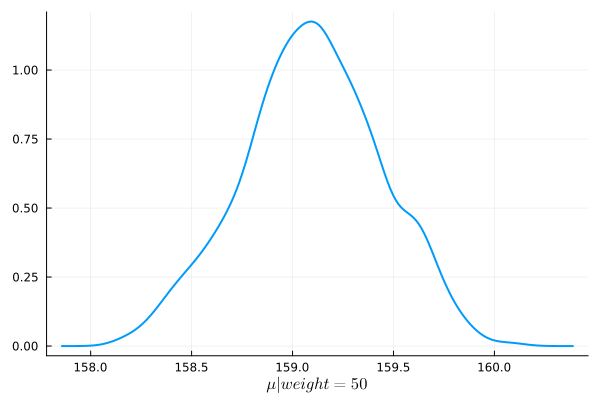

In [68]:
density(μ_at_50; lw=2, xlab=L"\mu|weight=50")

## Code 4.52  PI interval of mean height

In [69]:
PI(μ_at_50)

2-element Vector{Float64}:
 158.51242513705708
 159.65228899117074

## Code 4.53

In [70]:
μ = link(post_df, [:a :b], d2.weight, xbar);
μ = hcat(μ...);
Base.size(μ), μ[1:5,1]

((1000, 352), [157.19181779530345, 157.04555526629463, 156.4746801166828, 157.1413236024704, 157.15591986634513])

## Code 4.54

In [71]:
weight_seq = 25:70
μ = link(post_df, [:a :b], weight_seq, xbar);
μ = hcat(μ...);
Base.size(μ), μ[1:5,1]

((1000, 46), [138.30955859269528, 136.8350153707967, 135.46325611450138, 137.82412605293075, 136.54103988019477])

## Code 4.55

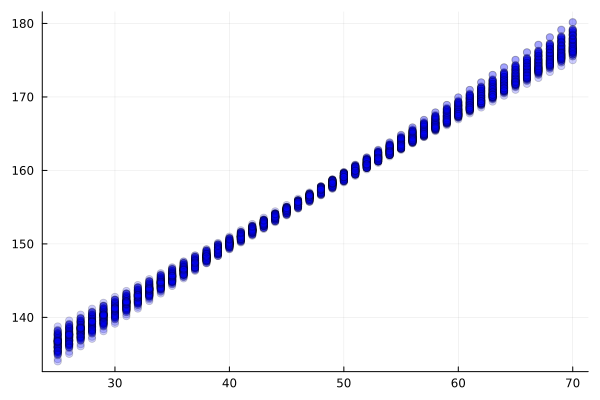

In [72]:
p = plot()
for i in 1:100
    scatter!(weight_seq, μ[i,:]; c=:blue, alpha=0.2)
end
display(p)

## Code 4.56

In [73]:
μ_mean = mean.(eachcol(μ))
μ_PI = PI.(eachcol(μ))
μ_PI = vcat(μ_PI'...);

## Code 4.57

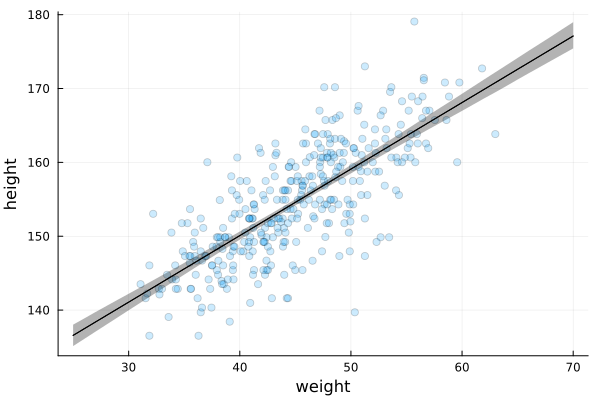

In [74]:
@df d2 scatter(:weight, :height; alpha=0.2, xlab="weight", ylab="height")
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=μ_PI, fillalpha=0.3)

## Code 4.58

In [75]:
post = sample(m4_3, 1000)
post = DataFrame(post)

weight_seq = 25:70
μ = map(w -> post.a + post.b * (w - xbar), weight_seq)
μ = hcat(μ...)
μ_mean = mean.(eachcol(μ))
μ_CI = PI.(eachcol(μ));

## Code 4.59

In [76]:
sim_height = simulate(post, [:a, :b, :σ], weight_seq .- xbar);
Base.size(sim_height), sim_height[1:5,1]

((1000, 46), [132.97888492271858, 145.38879186769424, 140.1487072900144, 133.23381173351325, 137.3628108522692])

## Code 4.60

In [77]:
height_PI = PI.(eachcol(sim_height))
height_PI = vcat(height_PI'...);

## Code 4.61

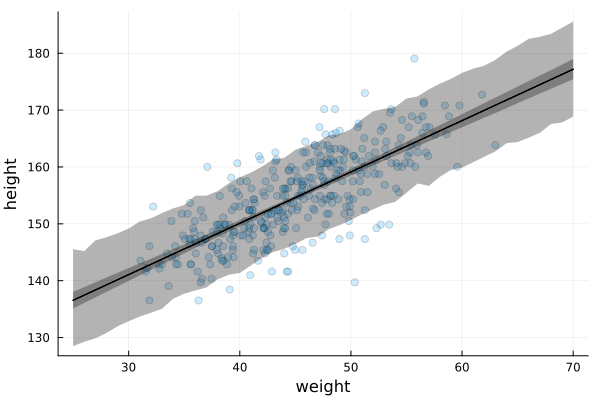

In [78]:
@df d2 scatter(:weight, :height; alpha=0.2, xlab="weight", ylab="height")
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=μ_PI, fillalpha=0.3)
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

## Code 4.62

In [79]:
post = sample(m4_3, 10_000)
post = DataFrame(post)
sim_height = simulate(post, [:a, :b, :σ], weight_seq .- xbar)
height_PI = PI.(eachcol(sim_height))
height_PI = vcat(height_PI'...);

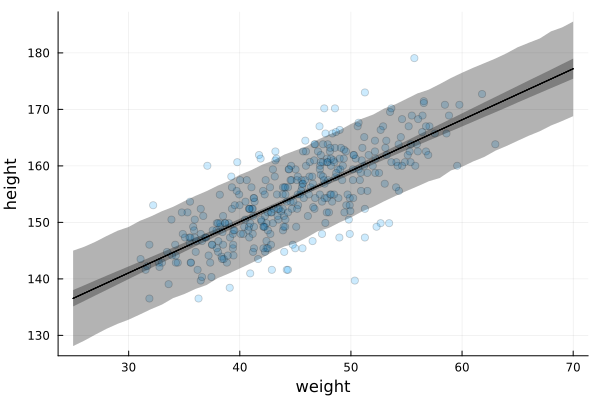

In [80]:
@df d2 scatter(:weight, :height; alpha=0.2, xlab="weight", ylab="height")
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=μ_PI, fillalpha=0.3)
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

## Code 4.63

In [81]:
post = sample(m4_3, 1000)
post = DataFrame(post)

sim_height = [
    [
        rand(Normal(a + b * (w - xbar), σ))
        for (a, b, σ) ∈ zip(post.a, post.b, post.σ)
    ]
    for w ∈ weight_seq
]
sim_height = hcat(sim_height...)

height_PI = PI.(eachcol(sim_height));
height_PI = vcat(height_PI'...);

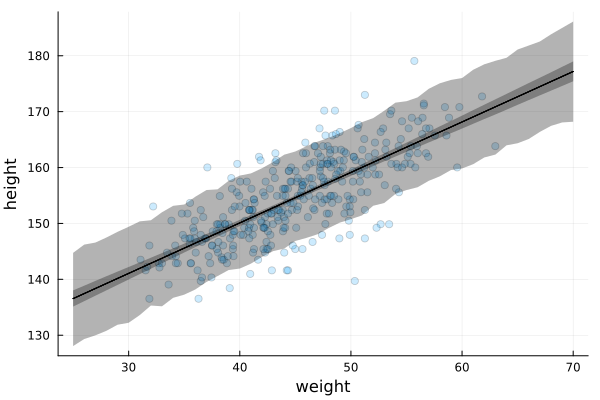

In [82]:
@df d2 scatter(:weight, :height; alpha=0.2, xlab="weight", ylab="height")
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=μ_PI, fillalpha=0.3)
plot!(weight_seq, [μ_mean μ_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

# 4.5 Curves from lines

## Code 4.64

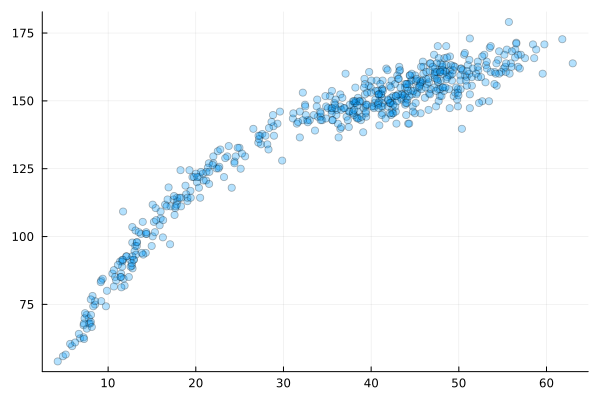

In [83]:
d = DataFrame(CSV.File("data/Howell1.csv"))
scatter(d.weight, d.height; alpha=0.3)

## Code 4.65

In [84]:
d[!, :weight_s] = standardize(ZScoreTransform, d.weight)
d[!, :weight_s2] = d.weight_s.^2;

@model function height_regr_m2(weight_s, weight_s2, height)
    a ~ Normal(178, 20)
    b1 ~ LogNormal(0, 1)
    b2 ~ Normal(0, 1)
    μ = @. a + b1 * weight_s + b2 * weight_s2
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

m4_5 = sample(height_regr_m2(d.weight_s, d.weight_s2, d.height), NUTS(), 1000)
m4_5 = resetrange(m4_5)
m4_5_df = DataFrame(m4_5);

## Code 4.66

In [85]:
precis(m4_5_df)

┌───────┬──────────────────────────────────────────────────────────┐
│ param │    mean     std     5.5%      50%    94.5%     histogram │
├───────┼──────────────────────────────────────────────────────────┤
│     a │  146.06  0.3668   145.46  146.059  146.623  ▁▁▃▆▇██▅▂▁▁▁ │
│    b1 │ 21.7362  0.2856  21.2794  21.7403  22.1727     ▁▁▄▆██▅▂▁ │
│    b2 │ -7.7985  0.2758  -8.2425  -7.7989  -7.3598     ▁▂▅██▅▃▁▁ │
│     σ │  5.8102  0.1676   5.5503   5.8085   6.0684  ▁▁▁▃▆██▆▄▂▁▁ │
└───────┴──────────────────────────────────────────────────────────┘


## Code 4.67

In [86]:
Random.seed!(1)
df = sample(m4_5_df, 1000)
weight_seq = range(-2.2, 2; length=30)

mu = link(df, (r, x) -> r.a + r.b1*x + r.b2*x^2, weight_seq)
mu = hcat(mu...)
mu_mean = mean.(eachcol(mu))
mu_PI = PI.(eachcol(mu))
mu_PI = vcat(mu_PI'...)

sim_height = simulate(df, (r, x) -> Normal(r.a + r.b1*x + r.b2*x^2, r.σ), weight_seq)
sim_height = vcat(sim_height'...);

height_PI = PI.(eachcol(sim_height))
height_PI = vcat(height_PI'...);

## Code 4.68

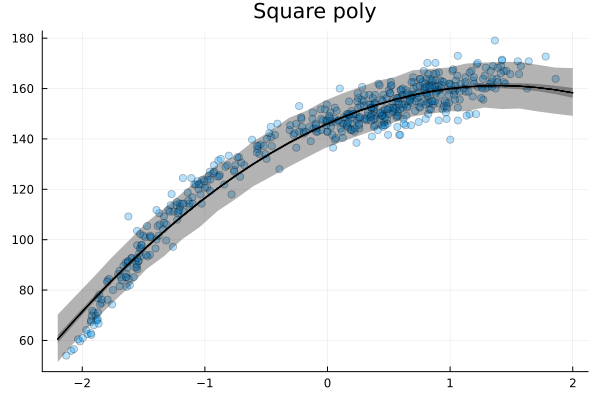

In [87]:
p_square = @df d scatter(:weight_s, :height; alpha=0.3, title="Square poly")
plot!(weight_seq, mu_mean; c=:black)
plot!(weight_seq, [mu_mean mu_mean]; c=:black, fillrange=mu_PI, fillalpha=0.3)
plot!(weight_seq, [mu_mean mu_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

## Code 4.69

In [88]:
d[!, :weight_s3] = d.weight_s.^3;

@model function height_regr_m3(weight_s, weight_s2, weight_s3, height)
    a ~ Normal(178, 20)
    b1 ~ LogNormal(0, 1)
    b2 ~ Normal(0, 1)
    b3 ~ Normal(0, 1)
    μ = @. a + b1 * weight_s + b2 * weight_s2 + b3 * weight_s3
    σ ~ Uniform(0, 50)
    height ~ MvNormal(μ, σ)
end

m4_6 = sample(height_regr_m3(d.weight_s, d.weight_s2, d.weight_s3, d.height), NUTS(), 1000)
m4_6 = resetrange(m4_6)
m4_6_df = DataFrame(m4_6)
precis(m4_6_df)

┌───────┬─────────────────────────────────────────────────────────┐
│ param │    mean     std     5.5%      50%    94.5%    histogram │
├───────┼─────────────────────────────────────────────────────────┤
│     a │ 146.402  0.3036  145.884  146.416  146.867   ▁▁▃▅██▆▃▁▁ │
│    b1 │ 15.1857  0.4898  14.3741  15.1921  15.9453      ▁▂▅█▅▁▁ │
│    b2 │ -6.2037  0.2639  -6.6274  -6.2174  -5.7711    ▁▂▅██▅▂▁▁ │
│    b3 │  3.5957  0.2352   3.2359   3.5897   3.9835   ▁▁▂▅██▄▂▁▁ │
│     σ │  4.8649  0.1503   4.6304    4.856   5.1178  ▁▁▄▇██▄▂▁▁▁ │
└───────┴─────────────────────────────────────────────────────────┘


In [89]:
Random.seed!(1)
df = sample(m4_6_df, 1000)
weight_seq = range(-2.2, 2; length=30)

func = (r, x) -> r.a + r.b1*x + r.b2*x^2 + r.b3*x^3
mu = link(df, func, weight_seq)
mu = hcat(mu...)
mu_mean = mean.(eachcol(mu))
mu_PI = PI.(eachcol(mu))
mu_PI = vcat(mu_PI'...)

func = (r, x) -> Normal(r.a + r.b1*x + r.b2*x^2 + r.b3*x^3, r.σ)
sim_height = simulate(df, func, weight_seq)
sim_height = vcat(sim_height'...);

height_PI = PI.(eachcol(sim_height))
height_PI = vcat(height_PI'...);

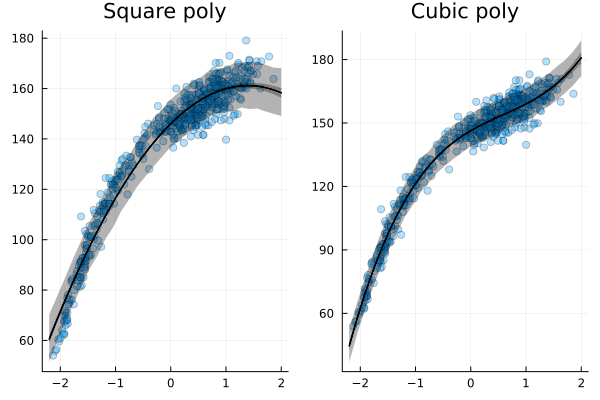

In [90]:
p_cubic = @df d scatter(:weight_s, :height; alpha=0.3, title="Cubic poly")
plot!(weight_seq, mu_mean; c=:black)
plot!(weight_seq, [mu_mean mu_mean]; c=:black, fillrange=mu_PI, fillalpha=0.3)
plot!(weight_seq, [mu_mean mu_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

plot(p_square, p_cubic; layout=(1, 2))

## Code 4.70 and 4.71

Looks like Julia plots don't support change of ticks proposed in the book.
But much more natural way will be to remap values we're plotting back to the original scale.
Example of this is below.

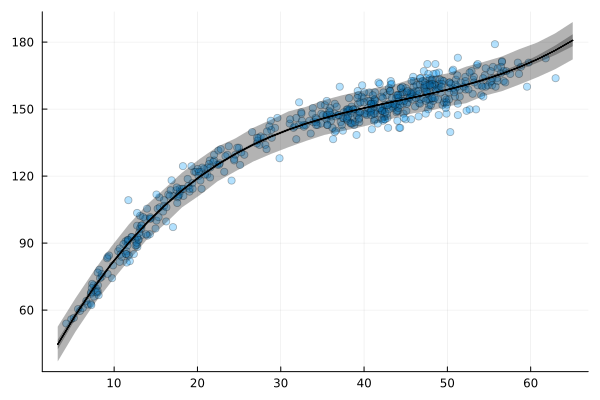

In [91]:
μ = mean(d.weight)
σ = std(d.weight)
w = @. d.weight_s * σ + μ
scatter(w, d.height; alpha=0.3)

w_s = @. weight_seq * σ + μ
plot!(w_s, mu_mean; c=:black)
plot!(w_s, [mu_mean mu_mean]; c=:black, fillrange=mu_PI, fillalpha=0.3)
plot!(w_s, [mu_mean mu_mean]; c=:black, fillrange=height_PI, fillalpha=0.3)

## Code 4.72

In [92]:
d = DataFrame(CSV.File("data/cherry_blossoms.csv", missingstring="NA"))
precis(d)

┌────────────┬─────────────────────────────────────────────────────────┐
│      param │   mean      std    5.5%     50%    94.5%      histogram │
├────────────┼─────────────────────────────────────────────────────────┤
│       year │ 1408.0  350.885  867.77  1408.0  1948.23  ████████████▂ │
│        doy │ 104.54    6.407   94.43   105.0    115.0       ▁▂▆██▅▂▁ │
│       temp │ 6.1419   0.6636    5.15     6.1   7.2947       ▁▄▆█▄▂▁▁ │
│ temp_upper │ 7.1852   0.9929  5.8977    7.04   8.9023       ▂██▃▁▁▁▁ │
│ temp_lower │ 5.0989   0.8503  3.7876   5.145     6.37       ▁▁▁▂▇█▂▁ │
└────────────┴─────────────────────────────────────────────────────────┘


## Code 4.73

In [93]:
d2 = d[completecases(d[!,[:doy]]),:]
d2 = disallowmissing(d2[!,[:year,:doy]])
num_knots = 15
knots_list = quantile(d2.year, range(0, 1; length=num_knots));

## Code 4.74

In [94]:
using BSplines

basis = BSplineBasis(3, knots_list)

LoadError: ArgumentError: Package BSplines not found in current path.
- Run `import Pkg; Pkg.add("BSplines")` to install the BSplines package.

## Code 4.75

In [95]:
p1 = plot(basis)
scatter!(knots_list, repeat([1], num_knots); xlab="year", ylab="basis", legend=false)

LoadError: UndefVarError: `basis` not defined

## Code 4.76

This way of calucalting bsplines is slightly slower, than shown in the book (with pre-calculated matrix) but it is much cleaner in my perspective.

You can do comparison yourself by precalculating spline matrix outside of the model and do matrix multiplication in the model instead of spline evialutaion. Example of doing this is at code block 4.79

In [96]:
@model function model_splines(year, doy)
    w ~ MvNormal(zeros(length(basis)), 1)
    a ~ Normal(100, 10)
    s = Spline(basis, w)
    μ = a .+ s.(year)
    σ ~ Exponential(1)
    doy ~ MvNormal(μ, σ)
end

m4_7 = sample(model_splines(d2.year, d2.doy), NUTS(0.65; init_ϵ = 9.765625e-5), 1000)

LoadError: UndefVarError: `basis` not defined

## Code 4.77

In [97]:
post = DataFrame(m4_7)

# convert columns w[*] into single column w
w_df = DataFrames.select(post, r"w")
post = DataFrames.select(post, Not(r"w"))
post[!,:w] = Vector.(eachrow(w_df))

# vector of 16 average w values
w_mean = mean.(eachcol(w_df))
p2 = plot(basis .* w_mean)
scatter!(knots_list, repeat([1], num_knots); xlab="year", ylab="basis × weight")

LoadError: UndefVarError: `m4_7` not defined

## Code 4.78

In [98]:
μ = link(post, (r, x) -> r.a + Spline(basis, r.w)(x), d2.year)
μ = vcat(μ'...);

μ_PI = PI.(eachrow(μ))
μ_PI = vcat(μ_PI'...);

p3 = @df d2 scatter(:year, :doy; alpha=0.3)
μ_mean = mean.(eachrow(μ_PI))
plot!(d2.year, [μ_mean, μ_mean]; c=:black, fillrange=μ_PI, fillalpha=0.3, alpha=0)

LoadError: UndefVarError: `basis` not defined

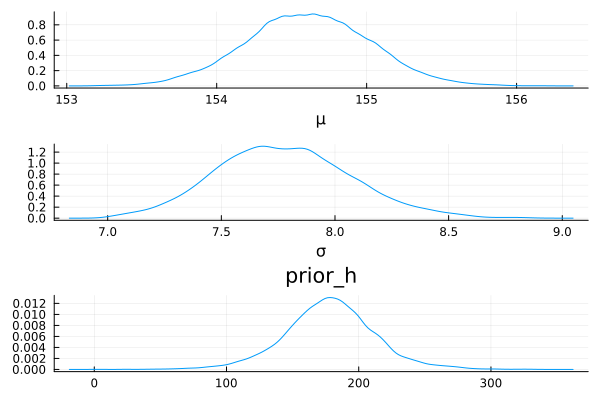

In [99]:
plot(p1, p2, p3; layout=(3, 1))

## Code 4.79

How to build the model with explicit spline matrix calculation

In [100]:
basis = BSplineBasis(3, knots_list)

# list of splines with 1 only at corresponding basis index
splines = [
    Spline(basis, [float(idx == knot) for idx ∈ 1:length(basis)])
    for knot ∈ 1:length(basis)
]

# calculate each spline for every year. Resulting matrix B is 827x16
B = [
    map(s -> s(year), splines)
    for year in d2.year
]
B = vcat(B'...);


# do not need years parameter anymore, all the information is in B matrix
@model function model_splines_matrix(doy)
    w ~ MvNormal(zeros(length(basis)), 1)
    a ~ Normal(100, 10)
    μ = a .+ B * w
    σ ~ Exponential(1)
    doy ~ MvNormal(μ, σ)
end

m4_7alt = sample(model_splines_matrix(d2.doy), NUTS(0.65; init_ϵ = 0.0001953125), 1000)

LoadError: UndefVarError: `BSplineBasis` not defined